In [9]:
import cv2
import os
import glob
import pickle
from tqdm import tqdm
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras import applications

In [5]:
resnet = applications.resnet50.ResNet50(weights=None, classes=365)
resnet.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,335,597 (92.83 MB)

 Trainable params: 24,282,477 (92.63 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [6]:
x = resnet.output
model_tmp = Model(inputs = resnet.input, outputs = x)

In [7]:
layer_3  = model_tmp.get_layer('conv2_block3_out').output   # stage 2
layer_7  = model_tmp.get_layer('conv3_block4_out').output   # stage 3
layer_13 = model_tmp.get_layer('conv4_block6_out').output   # stage 4
layer_16 = model_tmp.get_layer('conv5_block3_out').output   # stage 5 (cuối)


In [10]:
fcn1 = Conv2D(filters=2 , kernel_size=1, name='fcn1')(layer_16)

fcn2 = Conv2DTranspose(filters=K.int_shape(layer_13)[-1], kernel_size=4, strides=2, padding='same', name='fcn2')(fcn1)
fcn2_skip_connected = Add(name="fcn2_plus_layer13")([fcn2, layer_13])

fcn3 = Conv2DTranspose(filters=K.int_shape(layer_7)[-1], kernel_size=4, strides=2, padding='same', name="fcn3")(fcn2_skip_connected)
fcn3_skip_connected = Add(name="fcn3_plus_layer_7")([fcn3, layer_7])

fcn4 = Conv2DTranspose(filters=K.int_shape(layer_3)[-1], kernel_size=4, strides=2, padding='same', name="fcn4")(fcn3_skip_connected)
fcn4_skip_connected = Add(name="fcn4_plus_layer_3")([fcn4, layer_3])

# Upsample to original size
fcn5 = Conv2DTranspose(filters=2, kernel_size=16, strides=(4, 4), padding='same', name="fcn5")(fcn4_skip_connected)
relu255 = ReLU(max_value=255)(fcn5)


In [11]:
model = Model(inputs = resnet.input, outputs = relu255)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 34,243,204 (130.63 MB)

 Trainable params: 34,190,084 (130.42 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [12]:
def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))


model.compile(loss=root_mean_squared_error, optimizer='rmsprop')

In [13]:
# load weights into new model
model.load_weights("/content/colorization_12_1.weights.h5")
print("Loaded model from disk")

Loaded model from disk


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 2 variables whereas the saved optimizer has 224 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [1]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

In [14]:
import pickle

with open('/content/X_10.pkl', 'rb') as f:
    X = pickle.load(f)
with open('/content/y_10.pkl', 'rb') as f:
    y = pickle.load(f)

In [15]:
def regenerate_img(gray, hs):
    img = np.zeros((224, 224, 3))
    img [:, :, 2] = gray #V
    img [:, :, 0] = hs[:, :, 0] #H
    img [:, :, 1] = hs[:, :, 1] #S

    img = np.array(img, np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB) #Convert to RGB

    return img

In [16]:
def predict_hs(gray):
    img = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
    return model.predict(np.array([img]))[0]

In [17]:
index = np.random.choice(a=len(X), size=20)

In [20]:
grays = []
predicts = []
originals = []
for i in index:
    grays.append(X[i])
    predicts.append(regenerate_img(X[i], predict_hs(X[i])))
    originals.append(regenerate_img(X[i], y[i]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


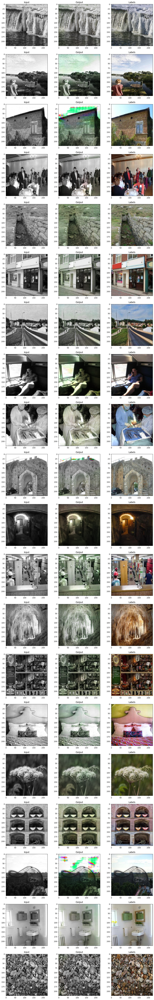

In [21]:
fig = plt.figure(figsize=(15, 15/3*len(grays)))
columns = 3
rows = len(grays)
show = []


for i in range(0, len(grays)):
    show.append( fig.add_subplot(rows, columns, i*3+1) )
    show[i*3].set_title("Input")  # set title
    plt.imshow(grays[i], cmap='gray')

    show.append( fig.add_subplot(rows, columns, i*3+2) )
    show[i*3+1].set_title("Output")
    plt.imshow(predicts[i])

    show.append( fig.add_subplot(rows, columns, i*3+3) )
    show[i*3+2].set_title("Labels")
    plt.imshow(originals[i])

plt.show()

**KẾT LUẬN**

Mô hình đã được tối ưu khi hàm loss dần hội tụ.
Tuy nhiên, điểm yếu là do sử dụng MSE nên màu của ảnh bị tính trung bình. Điều này dẫn đến trường hợp khi hai màu đối lập và khác biệt ở gần nhau thì mô hình sẽ tính ra màu trung bình, khiến ảnh bị xám xịt, gần giống như chỉ có một gam màu hoặc kém chân thực.

**Đề xuất**: Có thể chỉnh sửa hàm loss riêng biệt cho bài toán tô màu ảnh. Ví dụ, theo bài báo: https://arxiv.org/pdf/1603.08511
đề xuất một hàm loss mới dành riêng cho bài toán tô màu


In [22]:
print("Bắt đầu chương trình...")

try:
    # Đoạn code có thể gây lỗi
    x = 10 / 0   # lỗi chia cho 0
except Exception as e:
    print("Có lỗi xảy ra:", e)
    print("Đang chạy lệnh fix...")
    # Code fix lỗi ở đây
    x = 10 / 2

print("Giá trị x sau khi fix:", x)
print("Chương trình vẫn chạy tiếp bình thường...")

Bắt đầu chương trình...
Có lỗi xảy ra: division by zero
Đang chạy lệnh fix...
Giá trị x sau khi fix: 5.0
Chương trình vẫn chạy tiếp bình thường...
